# Summary

This analysis is based on the research paper "Secondary organic aerosol association with cardiorespiratory disease mortality in the United States," by Pye et al., which explains how chemicals called "Secondary Organic Aerosols" contribute to circulatory and/or respiratory related deaths in US counties. I attempt to apply the regression method implemented in the paper and make it more approachable. To the best of my knowledge, the authors of the paper did not make their regression model/results that clear to understand. Also, I had a hard time looking through their analysis code, but that could just me being a dummy.

Data Source: <https://datadryad.org/dataset/doi:10.5061/dryad.63xsj3v58#usage> <br>
Original Paper Source: <https://www.nature.com/articles/s41467-021-27484-1#Abs1> <br>
Citation: Pye, H.O.T., Ward-Caviness, C.K., Murphy, B.N. et al. Secondary organic aerosol association with cardiorespiratory disease mortality in the United States. Nat Commun 12, 7215 (2021). https://doi.org/10.1038/s41467-021-27484-1

# Introduction

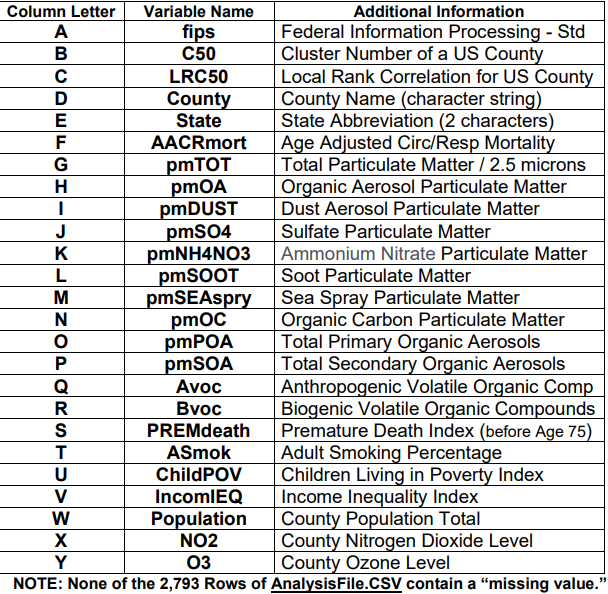

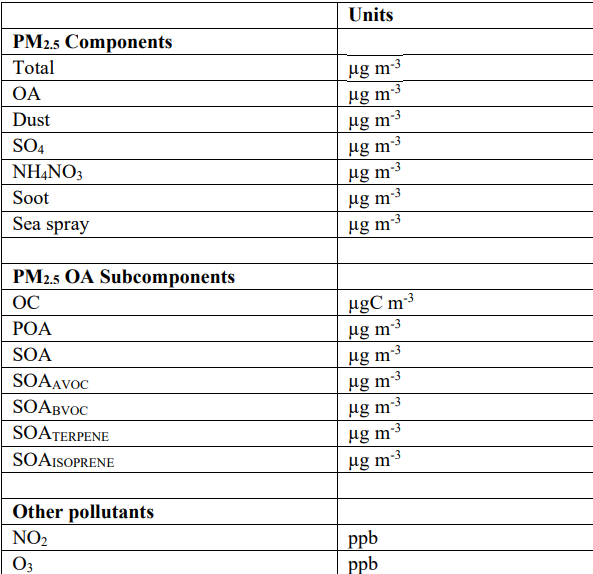

**Definitions**: <br>
- OA: Organic Aerosol
- Dust: refers to Dust Aerosol Particulate Matter (Data Dictionary)
- $SO_4$: Sulfate
- $NH_4NO_3$: Ammonium Nitrate
- Soot: black powder commonly found in chimneys
- Sea spray: aerosol particles from the water
- OC: Organic Carbon
- POA: Primary Organic Aerosol
- SOA: Secondary Organic Aerosol
- $SOA_AVOC$: Anthropogenic Volatile Organic Compound
- $SOA_BVOC$: Biogenic Volatile Organic Compound
- $NO_2$: Nitrogen Dioxide
- $O_3$: Ozone

**Context**: <br>

In terms of the differences between particulate matter (PM) and aerosols, PM is described as consisting of microscopic particles that are either solid or liquid. Aersol is a combination of PM and air (Wikipedia).

According to the research article "Comparison of primary aerosol emission and secondary aerosol formation from gasoline direct injection and port fuel injection vehicles," by Du et al., "Primary organic aerosol (POA) is emitted directly by sources, while secondary organic aerosol (SOA) is mainly formed via oxidation of gaseous precursors in the atmosphere and accounts for about 30–90 % of OA mass worldwide (as cited in Zhang et al., 2007; Hu et al., 2016)".

To understand volatile organic compounds and the two main types, the research paper "Effects of Anthropogenic and Biogenic Volatile Organic Compounds on Los Angeles Air Quality," by Gu, Guenther, and Faiola mention that "Volatile organic compounds (VOCs) are reactive chemicals that come from two major sources, namely, anthropogenic volatile organic compounds (AVOCs) emitted from human activity and biogenic volatile organic compounds (BVOCs) from terrestrial ecosystems (as cited in Guenther et al., 1995; Atkinson, 2000)".

For more information about aerosols and volatile organic compounds, pleas visit the following citations: <br>

Du, Z., Hu, M., Peng, J., Zhang, W., Zheng, J., Gu, F., Qin, Y., Yang, Y., Li, M., Wu, Y., Shao, M., and Shuai, S. Comparison of primary aerosol emission and secondary aerosol formation from gasoline direct injection and port fuel injection vehicles, Atmos. Chem. Phys., 18, 9011–9023, https://doi.org/10.5194/acp-18-9011-2018, 2018. <br>

Gu, S., Guenther, A., Faioloa, C. (2021). Effects of anthropogenic and biogenic volatile organic compounds on Los Angeles air quality. Environmental Science & Technology, *55*(18). https://pubs.acs.org/doi/10.1021/acs.est.1c01481 

# Exploratory Data Analysis

In [1]:
import pandas as pd
df = pd.read_csv("../data/AnalysisFile.csv")
df[df['State'] == 'FL']

,fips,C50,LRC50,County,State,AACRmort,pmTOT,pmOA,pmDUST,pmSO4,...,pmSOA,Avoc,Bvoc,PREMdeath,ASmok,ChildPOV,IncomIEQ,Population,NO2,O3
282,12001,21,0.292987,Alachua,FL,242.318591,7.308414,3.289508,1.915889,0.946566,...,2.667671,1.273418,1.394253,6900.674152,0.148948,0.218,6.132364,263496,2.296991,25.641318
283,12003,3,0.188238,Baker,FL,322.367236,6.851879,3.585838,1.389794,0.901420,...,2.936538,1.249884,1.686654,7984.312950,0.194037,0.239,4.121113,27937,1.363643,25.767230
284,12005,5,0.255330,Bay,FL,347.171063,6.893067,3.599782,1.384593,0.936483,...,3.023677,1.278040,1.745637,9478.016095,0.180388,0.230,4.297208,183974,1.156146,27.155750
285,12007,8,0.302563,Bradford,FL,310.882564,7.259926,3.335236,1.915389,0.930619,...,2.740532,1.259309,1.481223,10748.895890,0.215475,0.268,5.868113,26926,2.021730,25.937352
286,12009,28,0.136097,Brevard,FL,292.415031,5.943237,2.411603,1.254869,0.959048,...,1.905794,1.140313,0.765480,7836.583207,0.171240,0.217,4.406685,579130,2.083072,26.253654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,12125,38,-0.005495,Union,FL,575.084012,6.992345,3.416730,1.629984,0.912343,...,2.809404,1.261123,1.548281,18117.908390,0.248614,0.259,4.654548,15142,1.845580,25.635109
345,12127,21,0.292987,Volusia,FL,328.967136,6.480347,2.850550,1.457388,0.934027,...,2.291630,1.233124,1.058506,8589.872240,0.181343,0.197,4.314416,529364,2.060865,26.691555
346,12129,2,0.393153,Wakulla,FL,330.082649,6.971043,3.689834,1.245914,0.908007,...,3.030766,1.252934,1.777832,7451.688822,0.190639,0.180,3.674101,31893,0.730607,26.466275
347,12131,2,0.393153,Walton,FL,291.317950,7.116324,3.731062,1.509983,0.930633,...,3.162605,1.295174,1.867431,7482.770571,0.189572,0.213,4.776735,65889,1.305570,27.909994


In [2]:
df.describe()

,fips,C50,LRC50,AACRmort,pmTOT,pmOA,pmDUST,pmSO4,pmNH4NO3,pmSOOT,...,pmSOA,Avoc,Bvoc,PREMdeath,ASmok,ChildPOV,IncomIEQ,Population,NO2,O3
count,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,...,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2973.000000,2.973000e+03,2973.000000,2973.000000
mean,30298.612513,23.539522,0.185190,331.930400,6.493302,2.862265,1.485535,0.935082,0.757740,0.270964,...,2.208811,1.136941,1.071869,8147.096529,0.179137,0.224660,4.530069,1.067174e+05,2.133994,30.780160
std,14942.642831,13.425215,0.185561,83.270131,1.882615,1.110723,0.510893,0.231318,0.387428,0.123417,...,0.942304,0.383103,0.665569,2512.681756,0.035764,0.091906,0.720490,3.382033e+05,1.496398,2.473856
min,1001.000000,1.000000,-0.699301,95.503355,2.060866,0.683913,0.400707,0.386009,0.129804,0.056019,...,0.525746,0.228156,0.261143,2852.849951,0.067354,0.029000,2.931829,1.183000e+03,0.152411,19.507496
25%,19001.000000,12.000000,0.078360,274.276356,5.169846,2.001959,1.111772,0.800773,0.490988,0.200169,...,1.412979,0.873941,0.547257,6454.671194,0.153074,0.157000,4.027772,1.225300e+04,1.287691,29.472070
50%,29119.000000,23.000000,0.205510,322.830928,6.912045,2.918800,1.424630,0.978620,0.681191,0.264790,...,2.195113,1.222973,0.875683,7822.003587,0.174328,0.216000,4.430770,2.737000e+04,1.843456,30.859822
75%,45023.000000,34.000000,0.291971,380.300497,7.880292,3.671856,1.788169,1.093690,0.947133,0.328805,...,2.867685,1.423242,1.481223,9552.437582,0.203680,0.279000,4.880300,7.038200e+04,2.582380,31.833638
max,56045.000000,50.000000,0.600000,802.633607,14.315943,5.929338,6.127922,1.617896,2.245585,1.519724,...,4.604448,2.890584,3.309208,36469.014360,0.412018,0.663000,8.928957,1.013792e+07,19.574474,42.535041


Seems to be no nonsensical values such as negative values or weird values like 9999

In [3]:
df["County"].nunique()

1723

In [4]:
df.groupby("State")["County"].nunique().describe()

count     49.000000
mean      60.673469
std       44.114618
min        1.000000
25%       23.000000
50%       58.000000
75%       86.000000
max      234.000000
Name: County, dtype: float64

Number of counties per state has quite the variance

In [5]:
df["State"].nunique()

49

Hawaii is not included

In [6]:
df.isnull().sum()

fips          0
C50           0
LRC50         0
County        0
State         0
AACRmort      0
pmTOT         0
pmOA          0
pmDUST        0
pmSO4         0
pmNH4NO3      0
pmSOOT        0
pmSEAspry     0
pmOC          0
pmPOA         0
pmSOA         0
Avoc          0
Bvoc          0
PREMdeath     0
ASmok         0
ChildPOV      0
IncomIEQ      0
Population    0
NO2           0
O3            0
dtype: int64

No missing values

## Visualization

In [7]:
# <https://plotly.com/python/choropleth-maps/>
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response: counties = json.load(response)
counties['features'][100]

{'type': 'Feature',
 'properties': {'GEO_ID': '0500000US16067',
  'STATE': '16',
  'COUNTY': '067',
  'NAME': 'Minidoka',
  'LSAD': 'County',
  'CENSUSAREA': 757.591},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-113.931799, 42.535275],
    [-113.932904, 42.765032],
    [-113.763862, 42.764508],
    [-113.713928, 42.849733],
    [-113.714701, 43.20003],
    [-113.413693, 43.199785],
    [-113.413026, 42.84925],
    [-113.472155, 42.849218],
    [-113.472177, 42.669251],
    [-113.557609, 42.656416],
    [-113.655338, 42.535663],
    [-113.779811, 42.55687],
    [-113.931799, 42.535275]]]},
 'id': '16067'}

In [8]:
# Add a 0 to FIPS code to match geographic dataset 
import numpy as np
df['fips'] = df['fips'].astype('str')
df['fips'] = np.where(df['fips'].str.len() == 4, '0' + df['fips'], df['fips'])  # States with FIPS code of length 5 should not have a 0 in front
df['fips'] = df['fips'].astype('category')
df[df['State'] == 'FL']

,fips,C50,LRC50,County,State,AACRmort,pmTOT,pmOA,pmDUST,pmSO4,...,pmSOA,Avoc,Bvoc,PREMdeath,ASmok,ChildPOV,IncomIEQ,Population,NO2,O3
282,12001,21,0.292987,Alachua,FL,242.318591,7.308414,3.289508,1.915889,0.946566,...,2.667671,1.273418,1.394253,6900.674152,0.148948,0.218,6.132364,263496,2.296991,25.641318
283,12003,3,0.188238,Baker,FL,322.367236,6.851879,3.585838,1.389794,0.901420,...,2.936538,1.249884,1.686654,7984.312950,0.194037,0.239,4.121113,27937,1.363643,25.767230
284,12005,5,0.255330,Bay,FL,347.171063,6.893067,3.599782,1.384593,0.936483,...,3.023677,1.278040,1.745637,9478.016095,0.180388,0.230,4.297208,183974,1.156146,27.155750
285,12007,8,0.302563,Bradford,FL,310.882564,7.259926,3.335236,1.915389,0.930619,...,2.740532,1.259309,1.481223,10748.895890,0.215475,0.268,5.868113,26926,2.021730,25.937352
286,12009,28,0.136097,Brevard,FL,292.415031,5.943237,2.411603,1.254869,0.959048,...,1.905794,1.140313,0.765480,7836.583207,0.171240,0.217,4.406685,579130,2.083072,26.253654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
344,12125,38,-0.005495,Union,FL,575.084012,6.992345,3.416730,1.629984,0.912343,...,2.809404,1.261123,1.548281,18117.908390,0.248614,0.259,4.654548,15142,1.845580,25.635109
345,12127,21,0.292987,Volusia,FL,328.967136,6.480347,2.850550,1.457388,0.934027,...,2.291630,1.233124,1.058506,8589.872240,0.181343,0.197,4.314416,529364,2.060865,26.691555
346,12129,2,0.393153,Wakulla,FL,330.082649,6.971043,3.689834,1.245914,0.908007,...,3.030766,1.252934,1.777832,7451.688822,0.190639,0.180,3.674101,31893,0.730607,26.466275
347,12131,2,0.393153,Walton,FL,291.317950,7.116324,3.731062,1.509983,0.930633,...,3.162605,1.295174,1.867431,7482.770571,0.189572,0.213,4.776735,65889,1.305570,27.909994


In [9]:
import plotly.express as px
avg_aacrmort = np.median(df['AACRmort'])
fig = px.choropleth_map(df, geojson=counties, locations='fips', color='AACRmort',
                           color_continuous_scale=[(0, 'white'), ((np.percentile(df['AACRmort'],50) - np.min(df['AACRmort']))/ (np.max(df['AACRmort']) - np.min(df['AACRmort'])), 'grey'), (1, 'red')],
                           map_style="carto-positron",
                           zoom=3.3, center = {"lat": 37.0902, "lon": -95.7129},
                           opacity=0.6,
                           title="Circulatory/Respiratory related deaths per 100,000 people for each US County",
                           labels={'AACRmort':'Age Adjusted Circulatory/Respiratory Mortality'}
                          )
fig.update_layout(autosize=False, width=1200, height=750, margin={"r":0,"t":50,"l":0,"b":0})
fig.show()

# Regression Modeling

In [10]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
df.columns.tolist()

['fips',
 'C50',
 'LRC50',
 'County',
 'State',
 'AACRmort',
 'pmTOT',
 'pmOA',
 'pmDUST',
 'pmSO4',
 'pmNH4NO3',
 'pmSOOT',
 'pmSEAspry',
 'pmOC',
 'pmPOA',
 'pmSOA',
 'Avoc',
 'Bvoc',
 'PREMdeath',
 'ASmok',
 'ChildPOV',
 'IncomIEQ',
 'Population',
 'NO2',
 'O3']

In [11]:
df = pd.get_dummies(df, prefix = 'State', prefix_sep= '_', columns=['State'], dtype=float, drop_first=True)
df.head()

,fips,C50,LRC50,County,AACRmort,pmTOT,pmOA,pmDUST,pmSO4,pmNH4NO3,...,State_SD,State_TN,State_TX,State_UT,State_VA,State_VT,State_WA,State_WI,State_WV,State_WY
0,01001,1,0.276857,Autauga,382.440047,8.856426,4.918608,1.787338,1.069976,0.517202,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,01003,2,0.393153,Baldwin,294.201458,7.557820,3.984132,1.500587,1.027185,0.388567,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,01005,3,0.188238,Barbour,324.608872,7.616223,4.311328,1.403031,0.961859,0.434212,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,01007,1,0.276857,Bibb,399.060478,9.132600,5.354958,1.684212,1.044112,0.528688,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,01009,2,0.393153,Blount,427.333634,9.187908,4.562100,2.208111,1.089273,0.783359,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [12]:
state_cols = [col for col in df if col.startswith('State')]
num_cols = df.loc[:, ~df.columns.isin(['fips', 'C50','LRC50', 'County', 'AACRmort']) & ~df.columns.isin(state_cols)].columns
print(num_cols)
print("Number of columns:", len(num_cols))

Index(['pmTOT', 'pmOA', 'pmDUST', 'pmSO4', 'pmNH4NO3', 'pmSOOT', 'pmSEAspry',
       'pmOC', 'pmPOA', 'pmSOA', 'Avoc', 'Bvoc', 'PREMdeath', 'ASmok',
       'ChildPOV', 'IncomIEQ', 'Population', 'NO2', 'O3'],
      dtype='object')
Number of columns: 19


## Correlation Matrices and Feature Selection

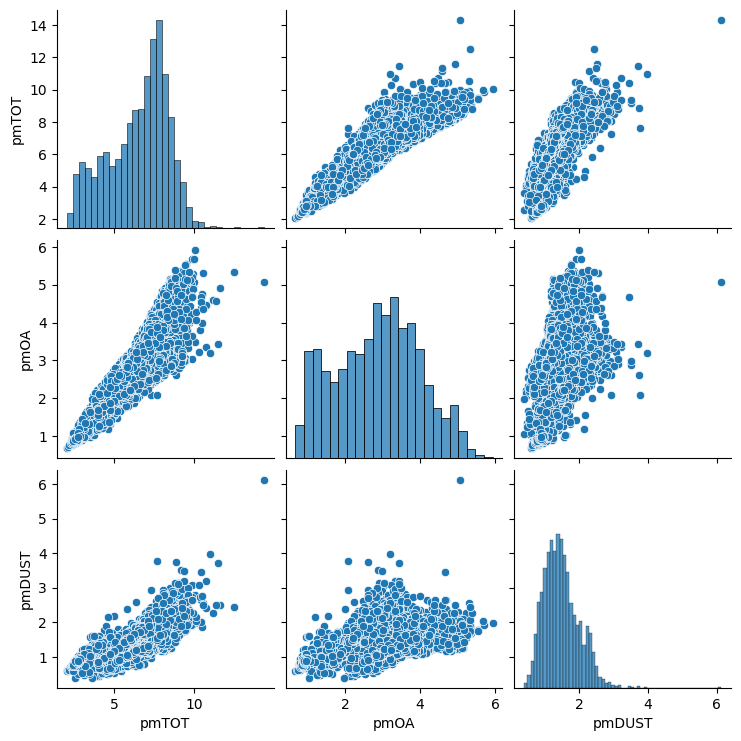

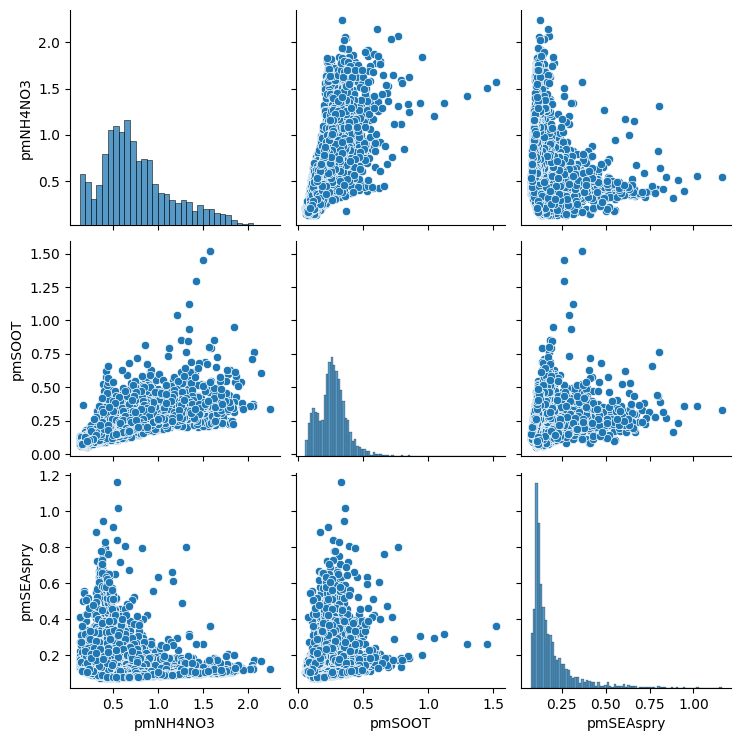

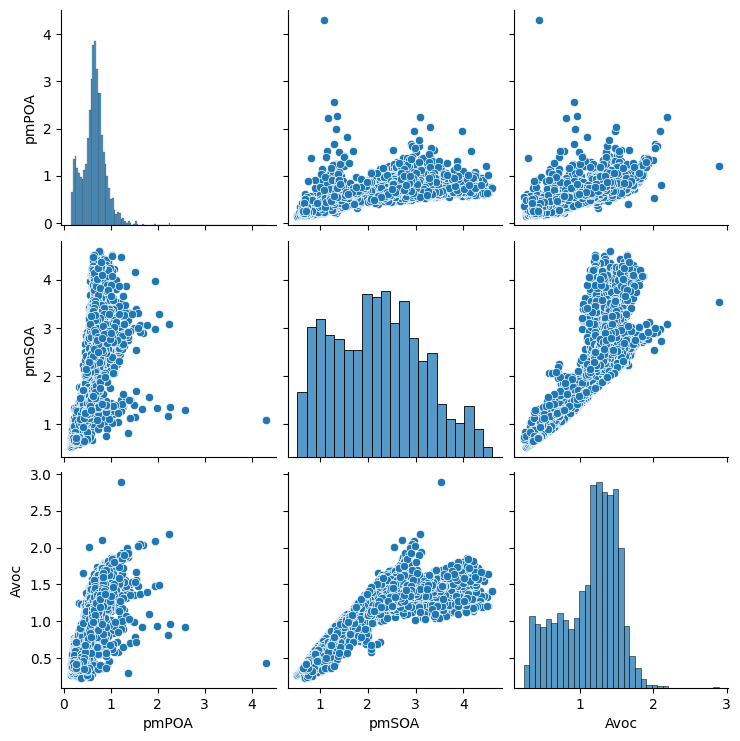

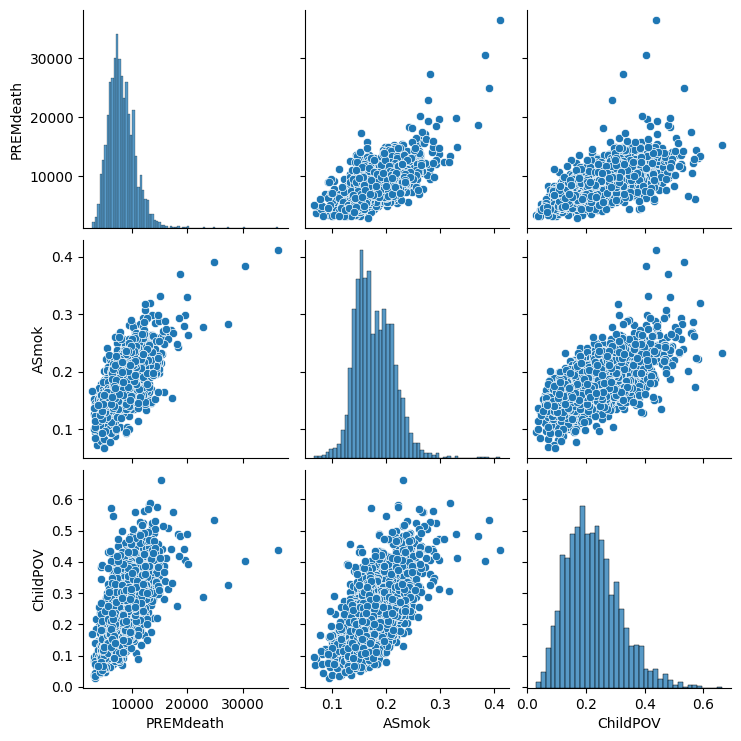

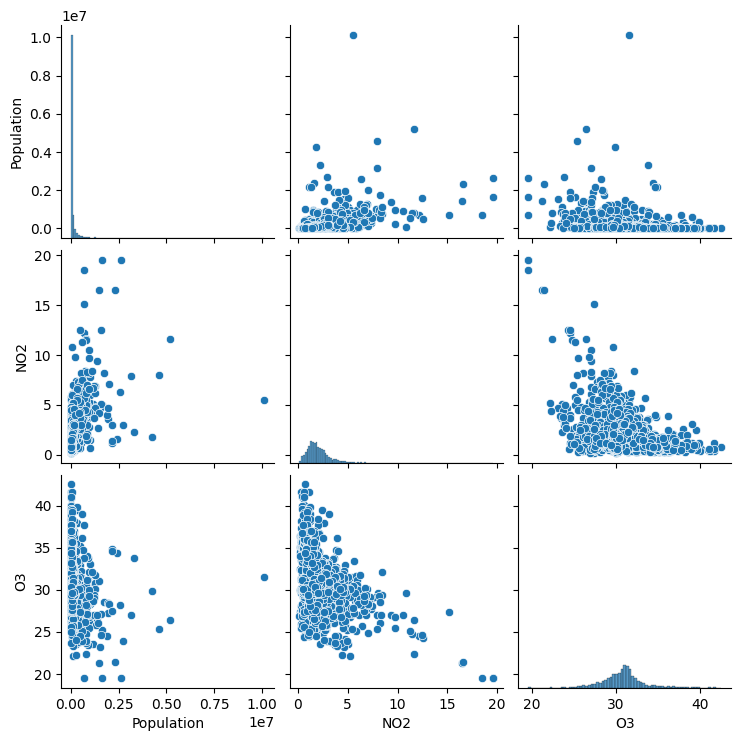

In [ ]:
# Show bivariate relationships for covariates
import seaborn as sns
for i in range(0, len(num_cols),4):
    sns.pairplot(df[num_cols[i:i+3]])


Based on these pairplots, there does seem to be a few "linear" relationships between some of the input variables. Some of the bivariate relationships are quite hard to describe as they have a complex pattern such as the one between pmSeaspry and pmSOOT. 

<Axes: >

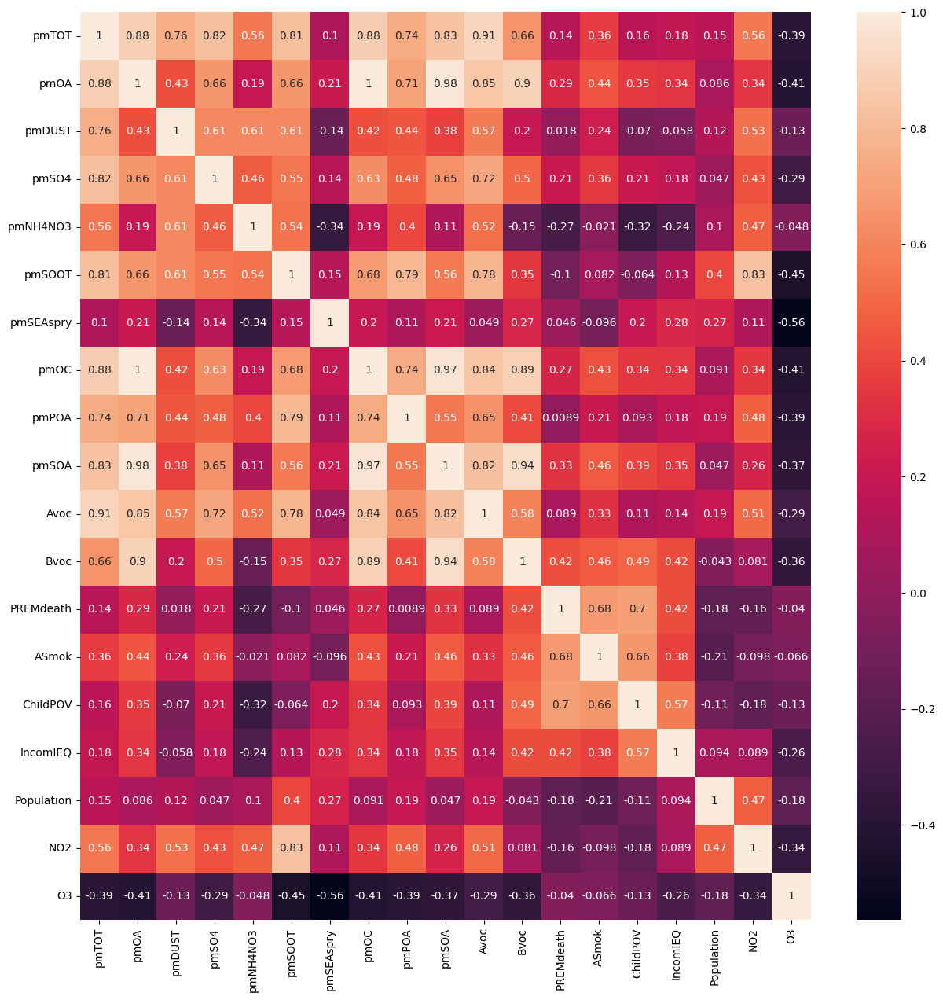

In [ ]:
corr_matrix = df[num_cols].corr(method="pearson")
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(corr_matrix, annot=True, ax=ax)

<Axes: >

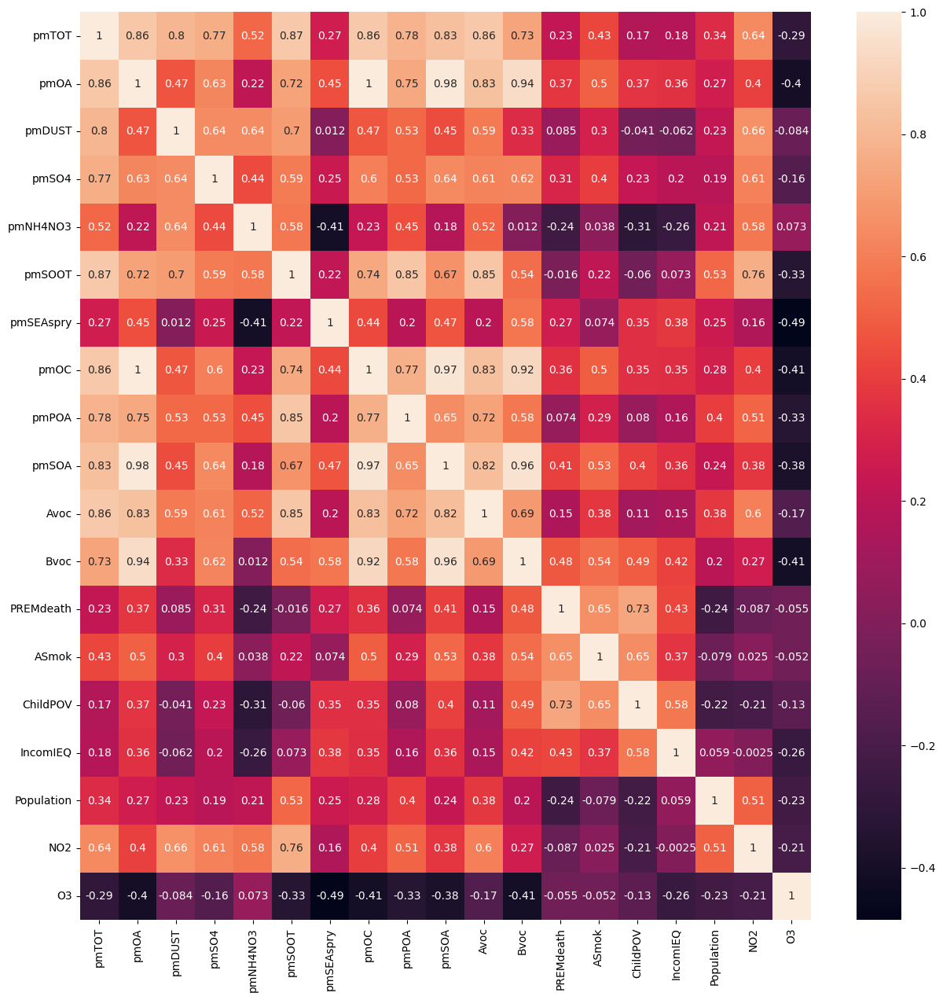

In [14]:
corr_matrix = df[num_cols].corr(method="spearman")
fig, ax = plt.subplots(figsize=(15,15))
sns.heatmap(corr_matrix, annot=True, ax=ax)

At a glance, there doesn't seem to be stark differences between using Pearson and Spearman correlation methods. There appears to be "significant" linear correlation between the particulate matter and aerosol columns. I think that feature selection must be done iteratively but not completely automated due to the structure of the columns. For example, it would only make sense to remove Avoc or Bvoc and not both of them since they are both "Volatile Organic Compound" columns. It would be more efficient to just do feature selection manually using some sort of correlation threshold approach in my opinion.

In [14]:
corr_vars = [col for col in df if col.startswith(('pm', 'Av', 'Bv')) and col not in ['pmSOA', 'pmSOOT', 'Avoc']]
print(corr_vars)

['pmTOT', 'pmOA', 'pmDUST', 'pmSO4', 'pmNH4NO3', 'pmSEAspry', 'pmOC', 'pmPOA', 'Bvoc']


<Axes: >

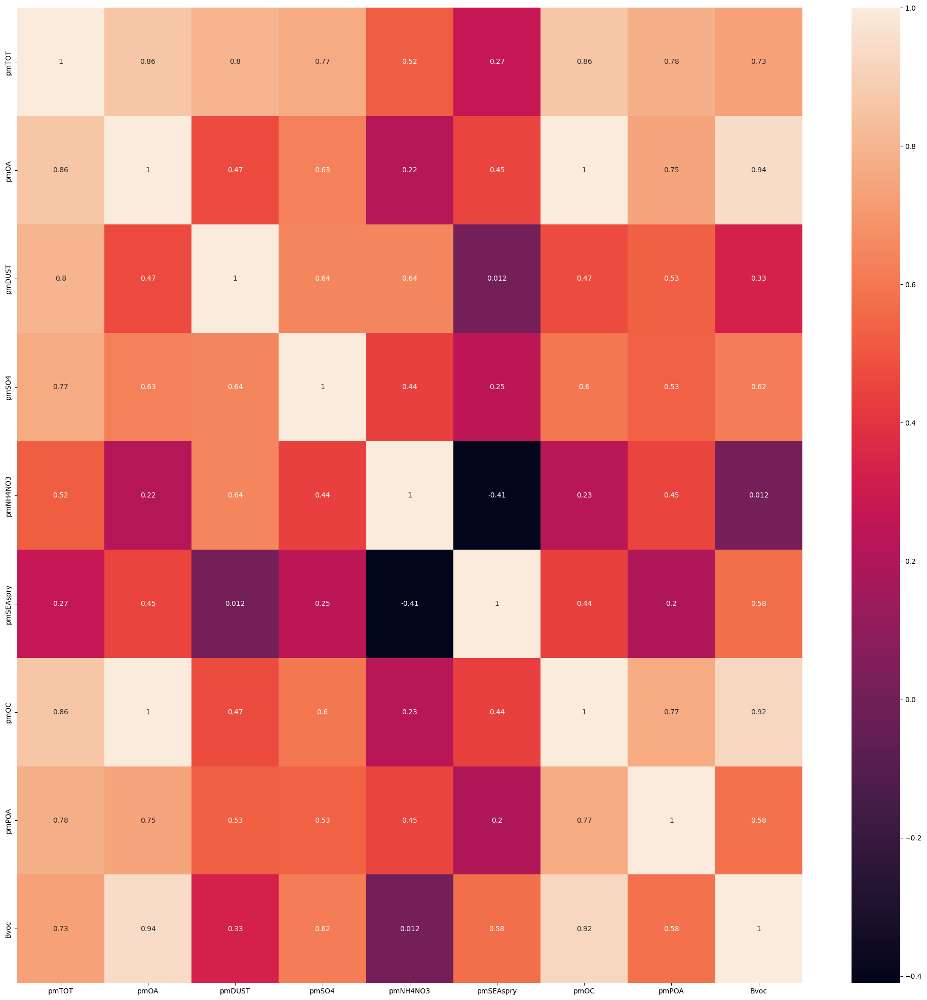

In [15]:
corr_matrix = df[corr_vars].corr(method="spearman")
fig, ax = plt.subplots(figsize=(25,25))
sns.heatmap(corr_matrix, annot=True, ax=ax)

In [16]:
threshold = 0.8

# Find pairs with high correlation
high_corr_pairs = {}
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            high_corr_pairs[(corr_matrix.columns[i], corr_matrix.columns[j])] = corr_matrix.iloc[i, j]   
            
# Print something if high correlation pairs are/aren't found 
if high_corr_pairs:
    print(high_corr_pairs)
    # Print out high correlation pairs
    print("Pairs with high correlation (|correlation| > {:.2f}):".format(threshold))
    for pair, corr_value in high_corr_pairs.items():
        print(f"{pair[0]} and {pair[1]}: {corr_value:.2f}")
else:
    print("There are no pairs with a correlation above the threshold: (|correlation| > {:.2f}):".format(threshold))

{('pmTOT', 'pmOA'): np.float64(0.8607035186889355), ('pmTOT', 'pmOC'): np.float64(0.8622969154318659), ('pmOA', 'pmOC'): np.float64(0.9973466135562945), ('pmOA', 'Bvoc'): np.float64(0.940104490011381), ('pmOC', 'Bvoc'): np.float64(0.924487386966133)}
Pairs with high correlation (|correlation| > 0.80):
pmTOT and pmOA: 0.86
pmTOT and pmOC: 0.86
pmOA and pmOC: 1.00
pmOA and Bvoc: 0.94
pmOC and Bvoc: 0.92


I tested both Pearson and Spearman-rank correlation methods. Both of these methods yielded similar results in terms of the coefficients.

In [17]:
del_cols = [col for col in num_cols if col not in corr_vars]
keep_cols = ['PREMdeath', 'ASmok', 'ChildPOV', 'IncomIEQ', 'Population', 'NO2', 'O3']
del_cols = [col for col in del_cols if col not in keep_cols]
print(del_cols)

['pmSOOT', 'pmSOA', 'Avoc']


In [18]:
x = df.loc[:, ~df.columns.isin(['fips', 'C50','LRC50', 'County', 'State', 'AACRmort']) & ~df.columns.isin(del_cols)]
y = df.loc[:, df.columns.isin(['AACRmort'])]
x = sm.add_constant(x)

In [19]:
x.columns

Index(['const', 'pmTOT', 'pmOA', 'pmDUST', 'pmSO4', 'pmNH4NO3', 'pmSEAspry',
       'pmOC', 'pmPOA', 'Bvoc', 'PREMdeath', 'ASmok', 'ChildPOV', 'IncomIEQ',
       'Population', 'NO2', 'O3', 'State_AR', 'State_AZ', 'State_CA',
       'State_CO', 'State_CT', 'State_DC', 'State_DE', 'State_FL', 'State_GA',
       'State_IA', 'State_ID', 'State_IL', 'State_IN', 'State_KS', 'State_KY',
       'State_LA', 'State_MA', 'State_MD', 'State_ME', 'State_MI', 'State_MN',
       'State_MO', 'State_MS', 'State_MT', 'State_NC', 'State_ND', 'State_NE',
       'State_NH', 'State_NJ', 'State_NM', 'State_NV', 'State_NY', 'State_OH',
       'State_OK', 'State_OR', 'State_PA', 'State_RI', 'State_SC', 'State_SD',
       'State_TN', 'State_TX', 'State_UT', 'State_VA', 'State_VT', 'State_WA',
       'State_WI', 'State_WV', 'State_WY'],
      dtype='object')

# Results

In [20]:
model = sm.OLS(y, x).fit()
print(model.summary(alpha=0.05))
print(model.condition_number)

                            OLS Regression Results                            
Dep. Variable:               AACRmort   R-squared:                       0.566
Model:                            OLS   Adj. R-squared:                  0.557
Method:                 Least Squares   F-statistic:                     59.31
Date:                Wed, 11 Jun 2025   Prob (F-statistic):               0.00
Time:                        14:14:40   Log-Likelihood:                -16123.
No. Observations:                2973   AIC:                         3.238e+04
Df Residuals:                    2908   BIC:                         3.277e+04
Df Model:                          64                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        249.4082     39.612      6.296      0.0

Numerical Variables to look at
- pmOC: The estimated avg value of AACRmort would increase by ~271 for every $\mu\text{g}\text{m}^-3$ increase in pmOC (Organic Carbon Particulate Matter)
- pmSO4: The estimated mean value for AACRmort would go up by ~216 for every every $\mu\text{g}\text{m}^-3$ increase also

This is quite substantial because AACRmort is the amount of deaths per 100,000 people. 

Looking at the coefficients for the confounders, they align with what we would think. A higher smoking percentage is associated with a higher estimated mean AACrmort value. It is the same with ChildPOV.

There is strong multicollinearity due to some confounding covariates used by the researchers. By not including the confounders, the condition number does dramatically lower. However, that is not to worry since we want to stick to the research design as much as possible while keeping things simple. By not including the confounders, we risk biasing our results and misleading ourselves. 

In terms of the states variables, the reference state variable (Alabama), has a high estimated avg. value which is indicated by the negative coefficients for most of the states. Looking at the table and the map from earlier, it can be seen that the Southeastern region has some "hotspots". 

In [21]:
from sklearn import metrics
print("Mean Absolute Error: ", metrics.mean_absolute_error(y, model.fittedvalues))
print("Mean Squared Error: ", metrics.mean_squared_error(y, model.fittedvalues))
print("Root Mean Squared Error: ", np.sqrt(metrics.mean_squared_error(y, model.fittedvalues)))

Mean Absolute Error:  39.89565137171595
Mean Squared Error:  3006.7322716363724
Root Mean Squared Error:  54.83367826105023


Looking at the regression evaluation metrics, they don't seem to be that "bad". If we take a look at mean absolute error which is on the same scale as our data, we would only be off by about 40 units on average. Our AACRmort estimate would be off by about 40 deaths per 100,000 at most. The R-squared and adjusted R-squared value is around 0.5 which isn't too surpising considering that we are dealing with US county data. For the MSE and RMSE scores, it makes sense for the RMSE to be a bit bigger than the MAE since it is more sensitive to outliers due to the squared term in its equation compared to MAE which just involes an absolute value term mostly. 

## QQ Plot

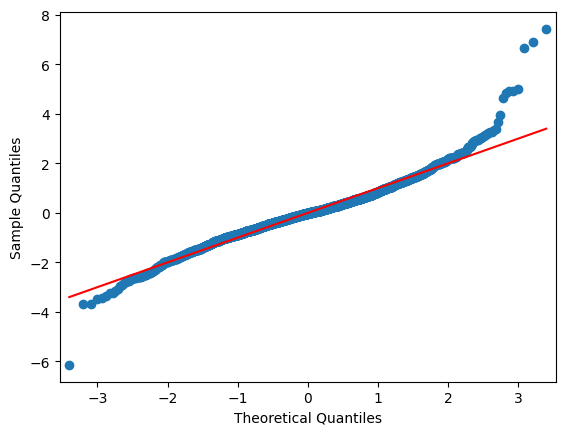

In [679]:
sm.qqplot(model.resid, line='s', fit=True)
plt.show()

Overall, residuals seem fine in regards to normality. However, there is quite heavy-tailed at the right end of the distribution. This could affect inference regarding the OLS coefficients.

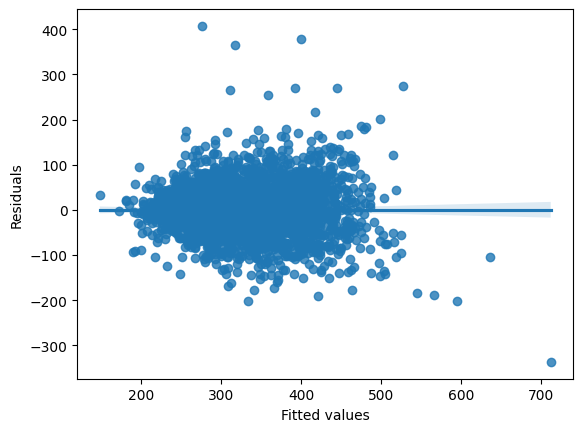

In [680]:
# Regular residuals vs fitted values plot
sns.regplot(x=model.fittedvalues, y=model.resid, ci=95, lowess=False)
plt.xlabel("Fitted values")
plt.ylabel("Residuals")
plt.show()

The heteroskedasticity does appear to be quite stable despite the obvious outliers. I think keeping those "outliers" is important so we can understand what input(s) is causing it to be hard to predict correctly. 

c:\Users\rdn91\OneDrive\Desktop\Coding\Python_Projects\pm_project\.venv\Lib\site-packages\statsmodels\stats\outliers_influence.py:847: RuntimeWarning:

invalid value encountered in sqrt



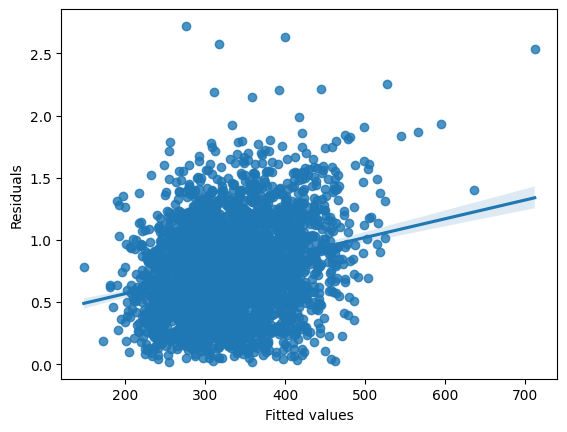

In [681]:
# Studentized residuals plot
temp = model.get_influence().resid_studentized_internal
std_resid = np.sqrt(np.abs(temp))
sns.regplot(x=model.fittedvalues, y=std_resid, ci=95, lowess=False)
plt.xlabel("Fitted values")
plt.ylabel("Residuals")
plt.show()

Results from studentized residuals will be ignored due to computation issues

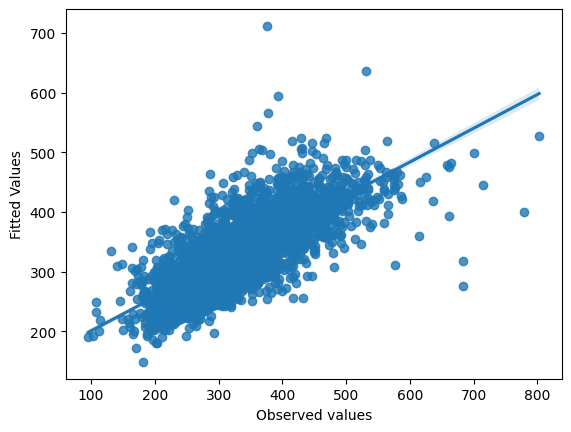

In [682]:
sns.regplot(y=model.fittedvalues, x=y, ci=95, lowess=False)
plt.xlabel("Observed values")
plt.ylabel("Fitted Values")
plt.show()

The fit does not appear to be that bad for a simple regression analysis. I had this same cluster issue with another dataset dealing with many counties and states. I thought about using a mixed effects model but after doing some light testing, it did not appear promising. Some more research is needed regarding the regression modeling of the effects of particulate matter/aersol pollutants on circulatory/respiratory related deaths in US counties.

## Checking for Autocorrelation with ACF/PACF Plot

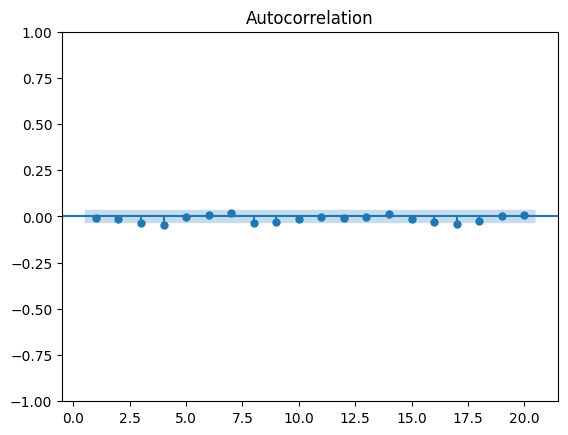

In [475]:
sm.graphics.tsa.plot_acf(model.resid, lags=20, zero=False)
plt.show()

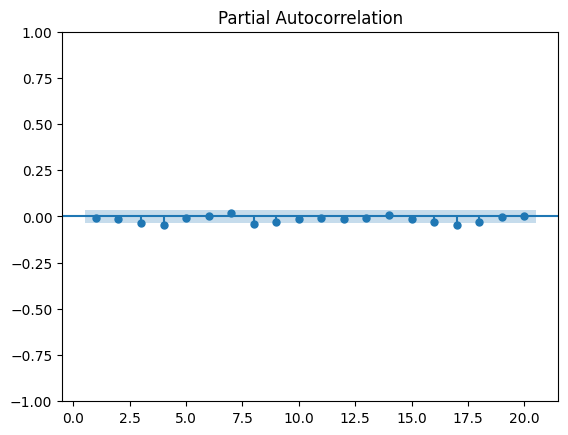

In [476]:
sm.graphics.tsa.plot_pacf(model.resid, lags=20, zero=False)
plt.show()

There does not appear to be any significant autocorrelation which is indicated by the absence of significant lags in the ACF/PACF plots. 

# Conclusion

After doing some exploratory data analysis and a basic regression, my main recommendation would be to focus more on the Southeast region in terms of US counties. In terms of which variables to research more, it is hard to say since we had to remove some features that were highly correlated. The highly correlated variables were drastically affecting the standard errors and beta estimates. More research needs to be done regarding the confounders because their presence is the main cause of the multicollinearity present. Only 3 variables had to be removed from the chemical-related variables to significantly reduce the multicollinearity. 

The main variables of interest based on the OLS results would be pmOC, pmSO4, pmNH4NO3, pmDUST, ChildPOV, and ASmok. It makes sense a bigger smoking percentage and a higher poverty index score for children results in a higher estimated mean value for AACRmort. The main goal is to establish a causal relationship between the age-adjusted circulatory/respiratory mortality for each US county and the variables listed above. Finding a better way to deal with the multicollinearity without having to sacrifice some features and interpretation is another important thing to consider.

In addition, finding the main sources for all of these different kinds of particulat matter/aersol compounds and cross-referencing them based on US counties would be another recommendation. One would have to be careful with spurious correlations by reevaluating the confounders given by the original researchers. 